In [1]:
import numpy as np
import matplotlib.pyplot as plt
import desc.io
from desc.grid import LinearGrid, ConcentricGrid
from desc.objectives import (
    ObjectiveFunction,
    FixBoundaryR,
    FixBoundaryZ,
    FixPressure,
    FixCurrent,
    FixIota,
    FixPsi,
    AspectRatio,
    ForceBalance,
    QuasisymmetryTwoTerm,
    RotationalTransform
)
from desc.optimize import Optimizer
from desc.plotting import (
    plot_grid,
    plot_boozer_modes,
    plot_boozer_surface,
    plot_qs_error,
    plot_boundaries,
    plot_boundary,
    plot_3d
)

from desc.equilibrium import Equilibrium
from desc.geometry import FourierRZToroidalSurface
from desc.profiles import PowerSeriesProfile

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


DESC version 0+untagged.9462.g9004056.dirty,using JAX backend, jax version=0.4.28, jaxlib version=0.4.28, dtype=float64
Using device: CPU, with 6.29 GB available memory


In [2]:
eq_fam = desc.io.load("inputs/nfp2_QA.h5")
eq_init = eq_fam[-1]
eq_qs = eq_init.copy()

'''surf1 = FourierRZToroidalSurface(
    R_lmn=[0, 0, 0, 0, 5, 1, 0, 0, 0],
    modes_R=[
        (-2, -2),
        (-1, -2),
        (-2, -1),
        (-1, -1),
        (0, 0),
        (1, 0),
        (2, 0),
        (0, 1),
        (1, 1)
    ],  # (m,n) pairs corresponding to R_mn on previous line
    Z_lmn=[1],
    modes_Z=[(-1, 0)],
    NFP=1,
)


eq_qs = Equilibrium(
    L=1,  # radial resolution
    M=2,  # poloidal resolution
    N=2,  # toroidal resolution
    surface=surf1
)'''


#plot_boundary(eq_qs, figsize=(6,6))
#plot_boozer_surface(eq_qs, figsize=(6,6))
#plot_3d(eq_qs, "|B|", figsize=(6,6))

'surf1 = FourierRZToroidalSurface(\n    R_lmn=[0, 0, 0, 0, 5, 1, 0, 0, 0],\n    modes_R=[\n        (-2, -2),\n        (-1, -2),\n        (-2, -1),\n        (-1, -1),\n        (0, 0),\n        (1, 0),\n        (2, 0),\n        (0, 1),\n        (1, 1)\n    ],  # (m,n) pairs corresponding to R_mn on previous line\n    Z_lmn=[1],\n    modes_Z=[(-1, 0)],\n    NFP=1,\n)\n\n\neq_qs = Equilibrium(\n    L=1,  # radial resolution\n    M=2,  # poloidal resolution\n    N=2,  # toroidal resolution\n    surface=surf1\n)'

In [3]:
optimizer = Optimizer("lsq-auglag")

grid_vol = LinearGrid(
    M=eq_qs.M_grid,
    N=eq_qs.N_grid,
    NFP=eq_qs.NFP,
    rho=np.arange(0.1,1.1,0.1),
    sym=eq_qs.sym
)

In [4]:
for maxMode in range(2,3):
    fixed_R_modes = np.vstack(([0,0,0], eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) > maxMode, :]))
    #print(np.max(np.abs(eq_qs.surface.R_basis.modes), 1))
    #print(np.max(np.abs(eq_qs.surface.R_basis.modes), 1) <= maxMode)
    free_R_modes = eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) <= maxMode, :]
    free_R_modes = free_R_modes[np.max(np.abs(free_R_modes), 1) > 0, :]
    #print(eq_qs.surface.R_basis.modes)
    #print(len(eq_qs.surface.R_basis.modes))
    #print(eq_qs.surface.R_basis.num_modes)
    #print(fixed_R_modes)
    #print(free_R_modes)
    #free_R_modes = free_R_modes[1:]
    
    fixed_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) > maxMode, :]
    free_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) <= maxMode, :]
    constWeight = 10
    #print(free_Z_modes)
    
    objective_f = ObjectiveFunction((
        #FixPressure(eq=eq_qs, weight=constWeight),
        #FixCurrent(eq=eq_qs, weight=constWeight),
        #FixPsi(eq=eq_qs, weight=constWeight),
        #ForceBalance(eq=eq_qs, weight=10),
        #QuasisymmetryTwoTerm(eq=eq_qs, grid=grid_vol, helicity=(1, 0), weight=1),
        #RotationalTransform(eq=eq_qs, target=0.42, loss_function="mean", weight=10),
        AspectRatio(eq=eq_qs, target=6, weight=1)
    ))

    numRbounds = len(free_R_modes)
    numZbounds = len(free_Z_modes)
    rub = np.ones(numRbounds)
    zub = np.ones(numZbounds)
    Rbounds = (-rub, rub)
    Zbounds = (-zub, zub)
    
    constraints = (
        FixBoundaryR(eq=eq_qs, modes=fixed_R_modes),
        FixBoundaryZ(eq=eq_qs, modes=fixed_Z_modes),
        FixPressure(eq=eq_qs),  # fix pressure profile
        FixPsi(eq=eq_qs),
        FixCurrent(eq=eq_qs),
        #FixBoundaryR(eq=eq_qs, modes=free_R_modes, bounds=Rbounds),
        #FixBoundaryZ(eq=eq_qs, modes=free_Z_modes, bounds=Zbounds),
    )

    #print(eq_qs.x_idx)
    
    eq_qs, result = eq_qs.optimize(
        objective=objective_f,
        constraints=constraints,
        optimizer=optimizer,
        copy=True,
        x_scale = np.ones(363),
        verbose=2,
        maxiter=20,
        options={}
    )

Building objective: aspect ratio
Precomputing transforms
Timer: Precomputing transforms = 818 ms
Timer: Objective build = 877 ms
Building objective: lcfs R
Building objective: lcfs Z
Building objective: fixed pressure
Building objective: fixed Psi
Building objective: fixed current
Building objective: self_consistency R
Building objective: self_consistency Z
Building objective: lambda gauge
Building objective: axis R self consistency
Building objective: axis Z self consistency
Timer: Objective build = 4.37 sec
Timer: Linear constraint projection build = 3.57 sec


/home/ryc/DESC/desc/optimize/optimizer.py:261: UserWarning: method lsq-auglag is not intended for scalar objective function
  warnings.warn(


Number of parameters: 171
Number of objectives: 1
Starting optimization
Using method: lsq-auglag
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality    Constr viol.   Penalty param  max(|mltplr|) 
       0              1          5.000e-01                                    1.003e+01      0.000e+00      1.000e+01      0.000e+00   
       1              2          4.853e-01      1.465e-02      1.000e-03      9.944e+00      0.000e+00      1.000e+01      0.000e+00   
       2              3          4.282e-01      5.718e-02      4.000e-03      9.563e+00      0.000e+00      1.000e+01      0.000e+00   
       3              4          2.259e-01      2.023e-01      1.600e-02      7.651e+00      0.000e+00      1.000e+01      0.000e+00   
       4              6          1.245e-01      1.014e-01      1.014e-02      6.052e+00      0.000e+00      1.000e+01      0.000e+00   
       5              8          6.900e-02      5.548e-02      7.090e-03      4.716e+00

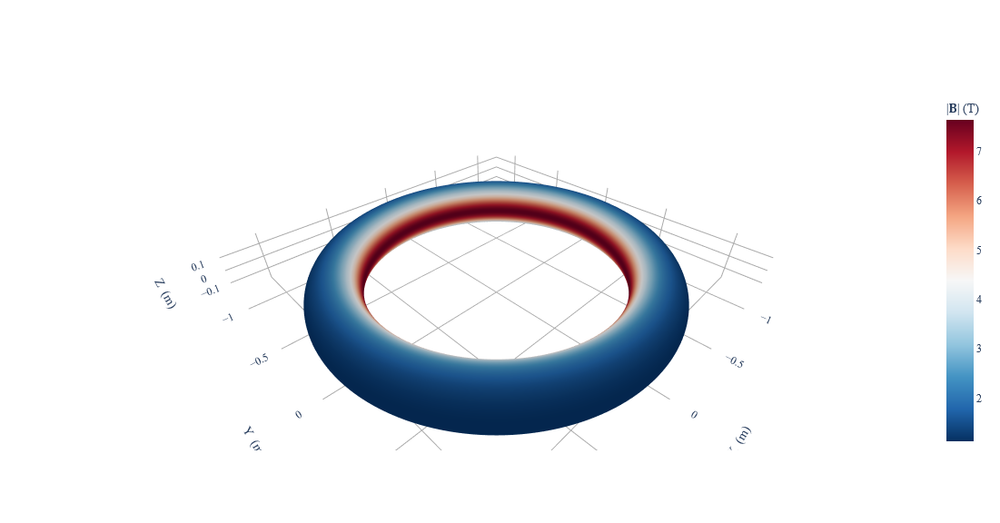

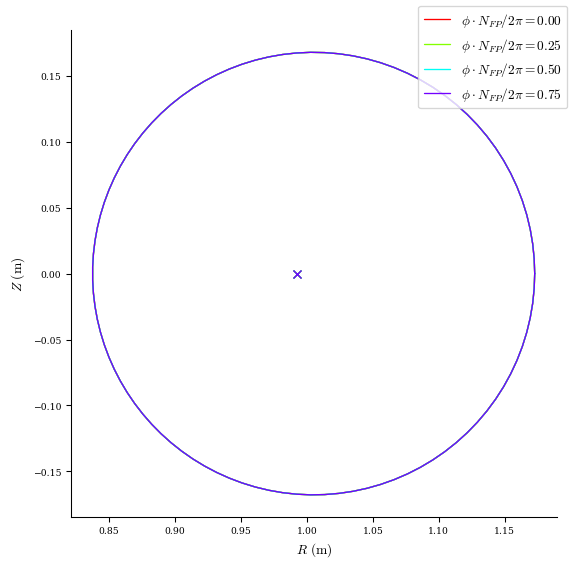

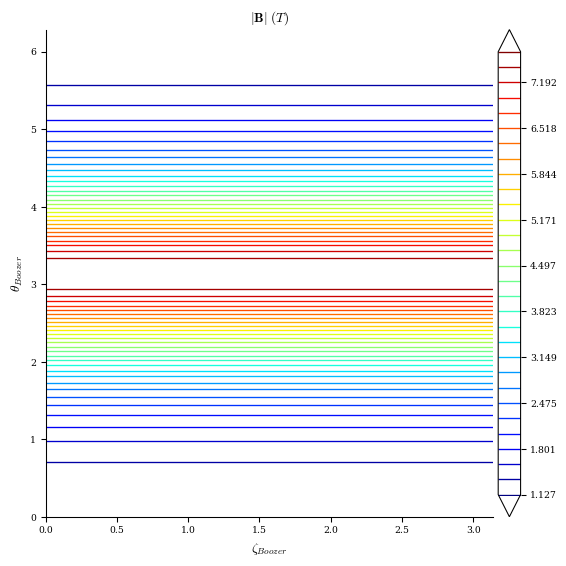

In [5]:
plot_boundary(eq_qs, figsize=(6,6))
plot_boozer_surface(eq_qs, figsize=(6,6))
plot_3d(eq_qs, "|B|", figsize=(6,6))

In [6]:
x = result.allx[-1]
objective_f = ObjectiveFunction(
        #RotationalTransform(eq=eq_qs, target=0.5, weight=1, loss_function="mean", grid=grid_vol),
        QuasisymmetryTwoTerm(eq=eq_qs, grid=grid_vol, helicity=(1, 4), weight=1)
    )
objective_f.build()
print(objective_f.compute_scalar(x))

Building objective: QS two-term
Precomputing transforms
285327.2068159927


In [7]:
eq_qs = eq_init.copy()

optimizer = Optimizer("TurboM")

for maxMode in range(2,3):
    fixed_R_modes = np.vstack(([0,0,0], eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) > maxMode, :]))
    #print(np.max(np.abs(eq_qs.surface.R_basis.modes), 1))
    #print(np.max(np.abs(eq_qs.surface.R_basis.modes), 1) <= maxMode)
    free_R_modes = eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) <= maxMode, :]
    free_R_modes = free_R_modes[np.max(np.abs(free_R_modes), 1) > 0, :]
    #print(eq_qs.surface.R_basis.modes)
    #print(len(eq_qs.surface.R_basis.modes))
    #print(eq_qs.surface.R_basis.num_modes)
    #print(fixed_R_modes)
    #print(free_R_modes)
    #free_R_modes = free_R_modes[1:]
    
    fixed_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) > maxMode, :]
    free_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) <= maxMode, :]
    constWeight = 10
    #print(free_Z_modes)
    
    objective_f = ObjectiveFunction((
        #FixPressure(eq=eq_qs, weight=constWeight),
        #FixCurrent(eq=eq_qs, weight=constWeight),
        #FixPsi(eq=eq_qs, weight=constWeight),
        #ForceBalance(eq=eq_qs, weight=1),
        #QuasisymmetryTwoTerm(eq=eq_qs, grid=grid_vol, helicity=(1, 0), weight=1),
        #RotationalTransform(eq=eq_qs, target=0.42, loss_function="mean", weight=10),
        AspectRatio(eq=eq_qs, target=6, weight=1)
    ))

    numRbounds = len(free_R_modes)
    numZbounds = len(free_Z_modes)
    rub = np.ones(numRbounds)
    zub = np.ones(numZbounds)
    Rbounds = (-rub, rub)
    Zbounds = (-zub, zub)
    
    constraints = (
        FixBoundaryR(eq=eq_qs, modes=fixed_R_modes),
        FixBoundaryZ(eq=eq_qs, modes=fixed_Z_modes),
        FixPressure(eq=eq_qs),  # fix pressure profile
        FixPsi(eq=eq_qs),
        FixCurrent(eq=eq_qs),
        #FixBoundaryR(eq=eq_qs, modes=free_R_modes, bounds=Rbounds),
        #FixBoundaryZ(eq=eq_qs, modes=free_Z_modes, bounds=Zbounds),
    )

    #print(eq_qs.x_idx)
    
    global_eq_qs, result = eq_qs.optimize(
        objective=objective_f,
        constraints=constraints,
        optimizer=optimizer,
        copy=True,
        x_scale = np.ones(363),
        verbose=2,
        maxiter=500,
        options={"trust_regions":2, "box_size":0.2}
    )

Building objective: aspect ratio
Precomputing transforms
Timer: Precomputing transforms = 35.5 ms
Timer: Objective build = 47.4 ms
Building objective: lcfs R
Building objective: lcfs Z
Building objective: fixed pressure
Building objective: fixed Psi
Building objective: fixed current
Building objective: self_consistency R
Building objective: self_consistency Z
Building objective: lambda gauge
Building objective: axis R self consistency
Building objective: axis Z self consistency
Timer: Objective build = 951 ms
Timer: Linear constraint projection build = 1.72 sec
Number of parameters: 171
Number of objectives: 1
Starting optimization
Using method: TurboM
Using dtype = torch.float64 
Using device = cpu
TR-0 starting from: 0.1331
TR-1 starting from: 0.148
684) New best @ TR-0: 0.1105
694) New best @ TR-0: 0.09039
704) New best @ TR-0: 0.05646
704) New best @ TR-1: 0.06447
724) New best @ TR-0: 0.03941
724) New best @ TR-1: 0.05138
744) New best @ TR-0: 0.03584
764) New best @ TR-0: 0.02813

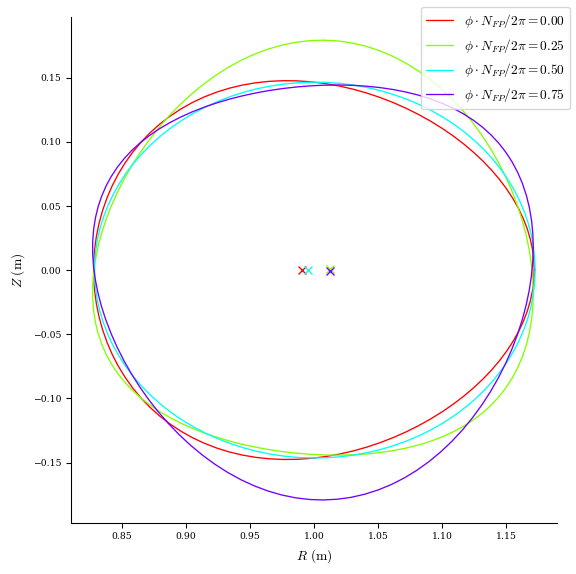

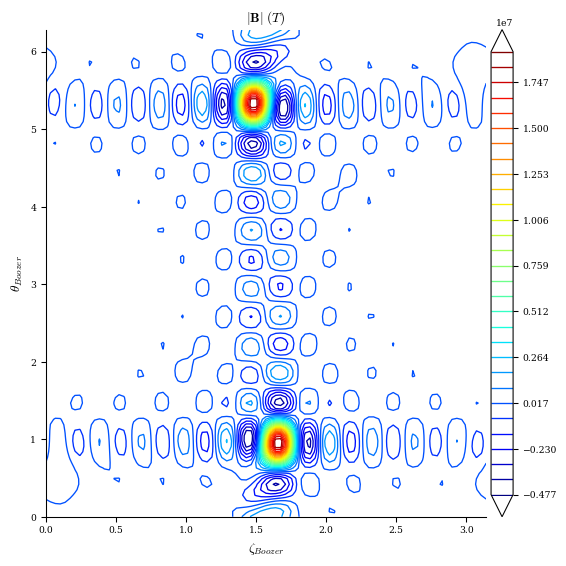

In [8]:
plot_boundary(global_eq_qs, figsize=(6,6))
plot_boozer_surface(global_eq_qs, figsize=(6,6))
plot_3d(global_eq_qs, "|B|", figsize=(6,6))